In [4]:
# Explainable AI - XAI
# Trust and Transparency
# Ethical and Legal Considerations
# Improving Models

In [5]:
#https://shap-lrjball.readthedocs.io/en/latest/api.html

In [1]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

iris = datasets.load_iris()
X = iris.data
y = iris.target


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

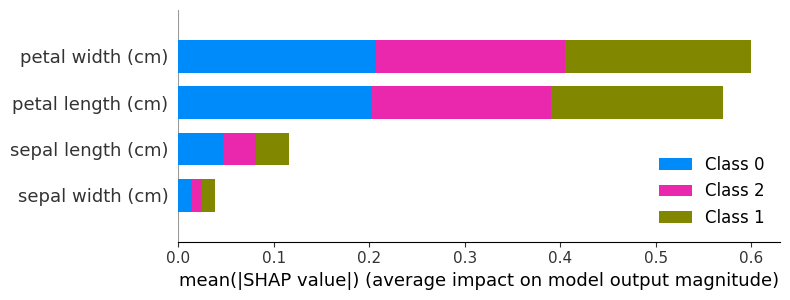

In [2]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, feature_names=iris.feature_names)


In [3]:
import shap
import matplotlib.pyplot as plt

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

for i in range(X_test.shape[0]):
    shap.initjs()
    display(shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_test[i], feature_names=iris.feature_names))


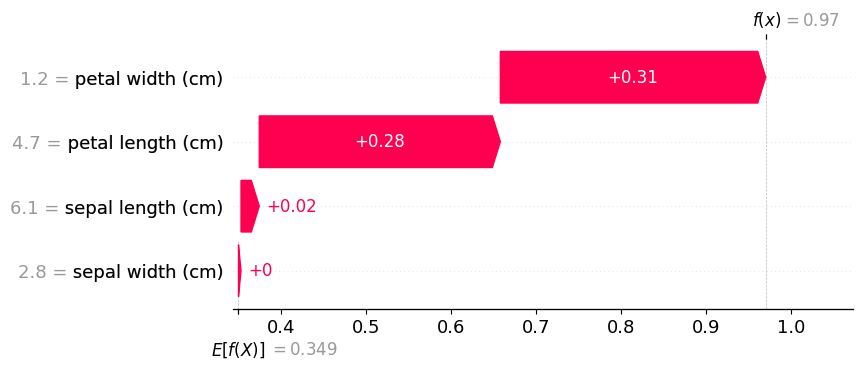

In [6]:
shap.initjs()
shap.waterfall_plot(shap.Explanation(values=shap_values[1][0], 
                                     base_values=explainer.expected_value[1], 
                                     data=X_test[0], 
                                     feature_names=iris.feature_names))
